# Project Python Foundations: FoodHub Data Analysis

### Context

The number of restaurants in New York is increasing day by day. Lots of students and busy professionals rely on those restaurants due to their hectic lifestyles. Online food delivery service is a great option for them. It provides them with good food from their favorite restaurants. A food aggregator company FoodHub offers access to multiple restaurants through a single smartphone app.

The app allows the restaurants to receive a direct online order from a customer. The app assigns a delivery person from the company to pick up the order after it is confirmed by the restaurant. The delivery person then uses the map to reach the restaurant and waits for the food package. Once the food package is handed over to the delivery person, he/she confirms the pick-up in the app and travels to the customer's location to deliver the food. The delivery person confirms the drop-off in the app after delivering the food package to the customer. The customer can rate the order in the app. The food aggregator earns money by collecting a fixed margin of the delivery order from the restaurants.

### Objective

The food aggregator company has stored the data of the different orders made by the registered customers in their online portal. They want to analyze the data to get a fair idea about the demand of different restaurants which will help them in enhancing their customer experience. Suppose you are hired as a Data Scientist in this company and the Data Science team has shared some of the key questions that need to be answered. Perform the data analysis to find answers to these questions that will help the company to improve the business.

### Data Description

The data contains the different data related to a food order. The detailed data dictionary is given below.

### Data Dictionary

* order_id: Unique ID of the order
* customer_id: ID of the customer who ordered the food
* restaurant_name: Name of the restaurant
* cuisine_type: Cuisine ordered by the customer
* cost_of_the_order: Cost of the order
* day_of_the_week: Indicates whether the order is placed on a weekday or weekend (The weekday is from Monday to Friday and the weekend is Saturday and Sunday)
* rating: Rating given by the customer out of 5
* food_preparation_time: Time (in minutes) taken by the restaurant to prepare the food. This is calculated by taking the difference between the timestamps of the restaurant's order confirmation and the delivery person's pick-up confirmation.
* delivery_time: Time (in minutes) taken by the delivery person to deliver the food package. This is calculated by taking the difference between the timestamps of the delivery person's pick-up confirmation and drop-off information

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Let us start by importing the required libraries

In [ ]:
# Installing the libraries with the specified version.
!pip install numpy==1.25.2 pandas==1.5.3 matplotlib==3.7.1 seaborn==0.13.1 -q --user

**Note**:
- After running the above cell, kindly restart the runtime (for Google Colab) or notebook kernel (for Jupyter Notebook), and run all cells sequentially from the next cell.
- On executing the above line of code, you might see a warning regarding package dependencies. This error message can be ignored as the above code ensures that all necessary libraries and their dependencies are maintained to successfully execute the code in ***this notebook***.

In [3]:
# import libraries for data manipulation
import numpy as np
import pandas as pd

# import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

### Understanding the structure of the data

In [77]:
# Write your code here to read the data
foodhub_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Python Course/Assignments/foodhub_order.csv')

In [78]:

# Write your code here to view the first 5 rows
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,Not given,25,20
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,Not given,25,23
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5,23,28
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3,25,15
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4,25,24


### **Question 1:** How many rows and columns are present in the data? [0.5 mark]

In [79]:
# Write your code here
foodhub_df.shape

(1898, 9)

#### Observations:
There are 1898 rows and 9 columns are in the foodhub dataset.

### **Question 2:** What are the datatypes of the different columns in the dataset? (The info() function can be used) [0.5 mark]

In [80]:
# Write your code here
foodhub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1898 entries, 0 to 1897
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order_id               1898 non-null   int64  
 1   customer_id            1898 non-null   int64  
 2   restaurant_name        1898 non-null   object 
 3   cuisine_type           1898 non-null   object 
 4   cost_of_the_order      1898 non-null   float64
 5   day_of_the_week        1898 non-null   object 
 6   rating                 1898 non-null   object 
 7   food_preparation_time  1898 non-null   int64  
 8   delivery_time          1898 non-null   int64  
dtypes: float64(1), int64(4), object(4)
memory usage: 133.6+ KB


#### Observations:
Foodhub dataset contains 9 columns. In which,

*   "order_id","customer_id","food_preparation_time","delivery_time" are integer type.
*   "restaurant_name","cuisine_type","day_of_the_week","rating" are object type.
*   "cost_of_the_order" is float type.

So, 4 integer data types, 4 object data types, 1 float data type - columns are in Foodhub dataset.






### **Question 3:** Are there any missing values in the data? If yes, treat them using an appropriate method. [1 mark]

In [81]:
# Write your code here
foodhub_df.isnull().sum()

,0
order_id,0
customer_id,0
restaurant_name,0
cuisine_type,0
cost_of_the_order,0
day_of_the_week,0
rating,0
food_preparation_time,0
delivery_time,0


In [82]:
# convert rating column into float type.
#1 convert 'Not given' value to NaN.

foodhub_df['rating'] = foodhub_df['rating'].replace('Not given', np.nan)
#2 convert rating column into float type.
foodhub_df['rating'] = foodhub_df['rating'].astype(float)

In [83]:
foodhub_df.isnull().sum()

,0
order_id,0
customer_id,0
restaurant_name,0
cuisine_type,0
cost_of_the_order,0
day_of_the_week,0
rating,736
food_preparation_time,0
delivery_time,0


In [84]:
foodhub_df['rating'].describe().T

,rating
count,1162.000000
mean,4.344234
std,0.741478
min,3.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


<Axes: xlabel='rating'>

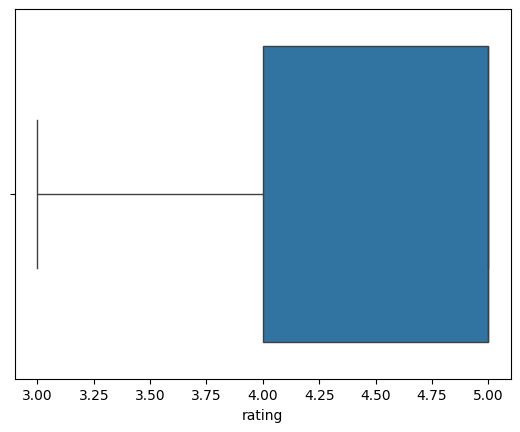

In [85]:
sns.boxplot(x=foodhub_df['rating'])

In [89]:
# Based on the boxplot info, median and max are 5 rating. Only 25% of the customers given 4 rating. Also this is left skewed.
# Hence replacing 38% of the missing value with median is more representative of real data.

foodhub_df['rating'] = foodhub_df['rating'].fillna(foodhub_df['rating'].median())


In [76]:
# List first 5 records to show the mediam applied in first 2 orders for sample.
foodhub_df.head(5)

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,5.0,25,20
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,5.0,25,23
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5.0,23,28
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3.0,25,15
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4.0,25,24


#### Observations:
Foodhub dataset, there is no missing values in it. I've verified this with 2 ways.
1) isnull().sum() - it returns 0 for all the columns.
2) info() - total entries and each column "Non-Null Count" are matched.
Hence there is no missing values. However in the dataset, rating column contains "Not given" value. Customer not given rating.


Total "Not given" value count is 736. Its 36% of the total records. Hence total we have 736 missing values.

#### Steps:
 1) Converted "Not given" to NaN and changed the datatype of the column to float.
 2) Created boxplot to check the data skew direction.
 3) Treated these missing values by median.

#### Analysis:
Since this rating values are left skewed. Also Median and Max are same 5 rating and no outliers.
Only 25% of the customer provided 4 rating. So applying median for these missing values to get more aligned with real data.

#### Conclusion
Applied median to all 'Not given' values.


### **Question 4:** Check the statistical summary of the data. What is the minimum, average, and maximum time it takes for food to be prepared once an order is placed? [2 marks]

In [90]:
# Write your code here
foodhub_df.describe()

,order_id,customer_id,cost_of_the_order,rating,food_preparation_time,delivery_time
count,1.898000e+03,1898.000000,1898.000000,1898.000000,1898.000000,1898.000000
mean,1.477496e+06,171168.478398,16.498851,4.598525,27.371970,24.161749
std,5.480497e+02,113698.139743,7.483812,0.662289,4.632481,4.972637
min,1.476547e+06,1311.000000,4.470000,3.000000,20.000000,15.000000
25%,1.477021e+06,77787.750000,12.080000,4.000000,23.000000,20.000000
50%,1.477496e+06,128600.000000,14.140000,5.000000,27.000000,25.000000
75%,1.477970e+06,270525.000000,22.297500,5.000000,31.000000,28.000000
max,1.478444e+06,405334.000000,35.410000,5.000000,35.000000,33.000000


#### Observations:
food_preparation_time column provides the key stastical information.
*   The minimum time to prepare food 20.00000 (20.0)
*   The average time to prepare food 27.371970 (27.37)
*   The maximum time to prepare food 35.00000 (35.0)

### **Question 5:** How many orders are not rated? [1 mark]

In [99]:
foodhub_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Python Course/Assignments/foodhub_order.csv')
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,Not given,25,20
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,Not given,25,23
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5,23,28
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3,25,15
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4,25,24


In [101]:
# Write the code here
foodhub_df.loc[foodhub_df['rating']=='Not given', 'rating'].value_counts()

,count
rating,
Not given,736


#### Observations:
Food hub dataset, rating column has 'Not given' was set and its total 736.


### Exploratory Data Analysis (EDA)

### Univariate Analysis

### **Question 6:** Explore all the variables and provide observations on their distributions. (Generally, histograms, boxplots, countplots, etc. are used for univariate exploration.) [9 marks]

In [102]:
# Impute "Not given" ratings to median as implemented in the Question 3 for further analysis.

def impute_ratings(df):
  #1 convert 'Not given' value to NaN.
  df['rating'] = df['rating'].replace('Not given', np.nan)
  #2 convert rating column into float type.
  df['rating'] = df['rating'].astype(float)
  df['rating'] = df['rating'].fillna(df['rating'].median())
  return df

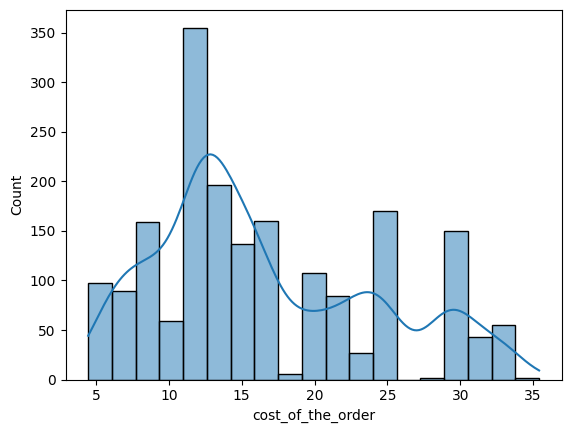

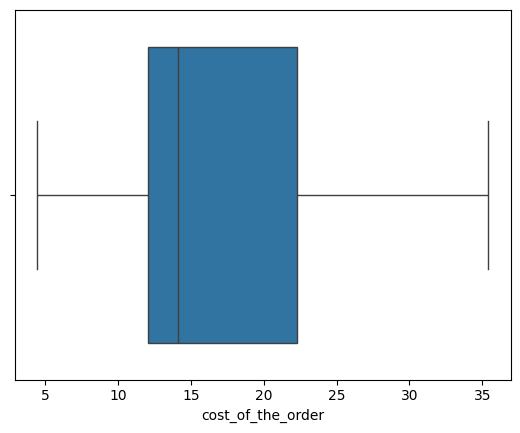

,cost_of_the_order
count,1898.000000
mean,16.498851
std,7.483812
min,4.470000
25%,12.080000
50%,14.140000
75%,22.297500
max,35.410000


In [103]:
# Write the code here

# Call impute ratings
foodhub_df = impute_ratings(foodhub_df)

# Histogram Plot
sns.histplot(data=foodhub_df, x='cost_of_the_order', kde=True)
plt.show()

# Box Plot
sns.boxplot(data=foodhub_df, x='cost_of_the_order')
plt.show()
foodhub_df['cost_of_the_order'].describe().T


#### Observations

*   The distribution of the cost_of_the_order is slightly right skew.

Histogram Observations:
*  The distribution is clearly multimodal distribution. Its not noraml distribution. Since there are several peaks can be found in this chart.
   
   * A major peak around 12 - 13 which is exceeding 350 counts.
   * A secondary peak around 16.
   * Another significant peak around 26.
   * A smaller peak around 30.
* The order cost range approximately 5 to 35.

Boxplot Observations:

*  The boxplot summarizes the minimum, 1st quartile(Q1), 2nd quartile(Q2), 3rd quartile(Q3) and maximum. In which, Q2 is median.
* Q2 (Median) is near to 15. This shows that 50% of the orders have a below 15dollars.
* Q1 is around 12 dollars.
* Q3 is around 22 dollars.
* IQR is Q3-Q1, which is 22-12=10. This provides that the middle 50% of the data falls between costs 12 and 22 dollars.
* The median line is slighlty closer to the Q1 which tells that its slightly rightly skew.
* There is no visible outliers points beyond the whiskers in this plot. Its tells that minimum and maximum order costs are within the accepted range.






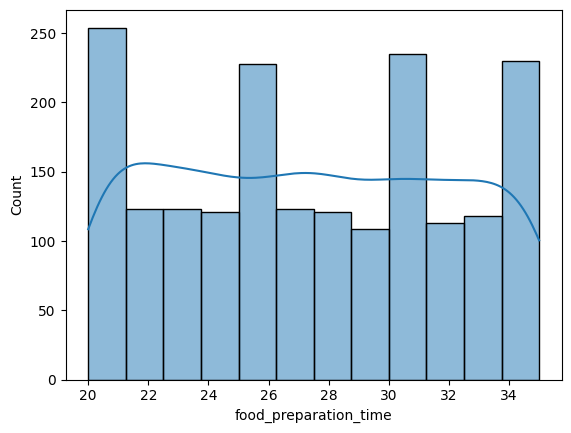

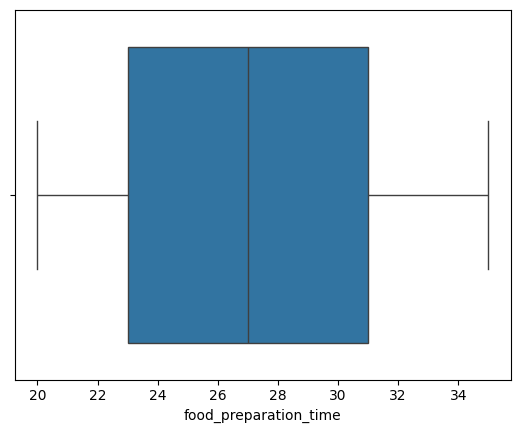

,food_preparation_time
count,1898.000000
mean,27.371970
std,4.632481
min,20.000000
25%,23.000000
50%,27.000000
75%,31.000000
max,35.000000


In [ ]:
# Histogram plot
sns.histplot(data=foodhub_df, x='food_preparation_time', kde=True)
plt.show()

# Box Plot
sns.boxplot(data=foodhub_df, x='food_preparation_time')
plt.show()
foodhub_df['food_preparation_time'].describe().T

In [ ]:
# Food preparation time - Minium
foodhub_df[foodhub_df['food_preparation_time']==20.0].value_counts()

,,,,,,,,,count
order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time,
1476548,122609,Blue Ribbon Sushi,Japanese,6.84,Weekend,4,20,30,1
1476572,356195,Blue Ribbon Fried Chicken,American,29.15,Weekday,5,20,29,1
1476625,348352,Olea,Mediterranean,6.69,Weekday,Not given,20,28,1
1476633,137565,Shake Shack,American,15.76,Weekend,5,20,25,1
1476639,399172,Blue Ribbon Fried Chicken,American,14.07,Weekday,Not given,20,31,1
...,...,...,...,...,...,...,...,...,...
1478399,264399,Han Dynasty,Chinese,29.15,Weekday,Not given,20,24,1
1478414,41409,Nobu Next Door,Japanese,12.66,Weekend,Not given,20,21,1
1478422,197832,The Meatball Shop,Italian,14.84,Weekend,Not given,20,28,1


In [ ]:
# Food preparation time - Maximum
foodhub_df[foodhub_df['food_preparation_time']==35.0].value_counts()

,,,,,,,,,count
order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time,
1476548,122609,Blue Ribbon Sushi,Japanese,6.84,Weekend,4,20,30,1
1476572,356195,Blue Ribbon Fried Chicken,American,29.15,Weekday,5,20,29,1
1476625,348352,Olea,Mediterranean,6.69,Weekday,Not given,20,28,1
1476633,137565,Shake Shack,American,15.76,Weekend,5,20,25,1
1476639,399172,Blue Ribbon Fried Chicken,American,14.07,Weekday,Not given,20,31,1
...,...,...,...,...,...,...,...,...,...
1478399,264399,Han Dynasty,Chinese,29.15,Weekday,Not given,20,24,1
1478414,41409,Nobu Next Door,Japanese,12.66,Weekend,Not given,20,21,1
1478422,197832,The Meatball Shop,Italian,14.84,Weekend,Not given,20,28,1


#### Observations
Food preparation time distributions:
* Histogram shows that the distribution is not skewed.
* Boxplot shows that the distribution doesn't show any outliers.
* 50% of the food preparation time lies between 23mins to 31mins. (IQR=Q2-Q1)
* Distribution is mostly normal distribution or uniform-like distribution.
* Average time to prepare food is 27.37mins.
* Maximum time taken to preparing food is 35minutes for 117 orders.
* Minimum time taken to preapring food is 20minutes for 119 orders.
* Food preparation time ranges from approximately 20 to 35 minutes.




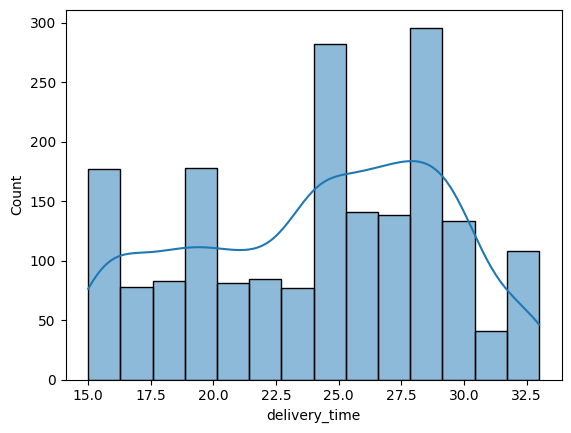

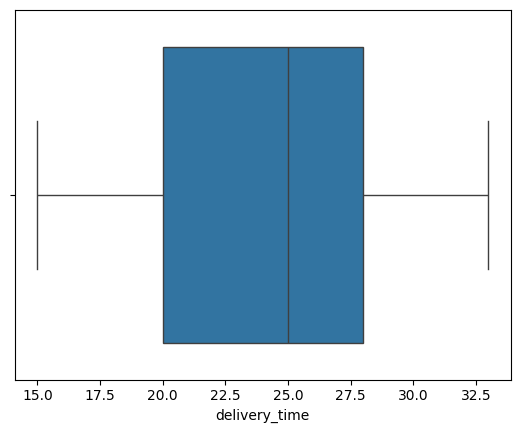

,delivery_time
count,1898.000000
mean,24.161749
std,4.972637
min,15.000000
25%,20.000000
50%,25.000000
75%,28.000000
max,33.000000


In [ ]:
# Delivery time distribution.
# Histogram Plot
sns.histplot(data=foodhub_df, x='delivery_time', kde=True)
plt.show()
# Box Plot
sns.boxplot(data=foodhub_df, x='delivery_time')
plt.show()
foodhub_df['delivery_time'].describe().T

#### Observations

Delivery time distributions:

*   Histogram shows that the distribution is rightly skewed.
*   Boxplot shows that the distribution no outliers.
*   Average time took to delivery is 24.16mins.
*   50% of the delivery time between 20 to 28 minutes (IQR= Q2-Q1).
*   The major peak in the histogram is at around 28 minutes with a count of around 295.
*   The highest peak in the histogram is at around 25 minutes with a count of around 280.
*   There is 2 smaller peaks 15 and 20 minutes with a count of around 180.

In [ ]:
# Install Ploty
!pip install plotly

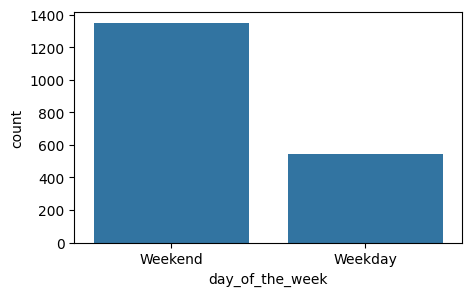

In [106]:
# Day of the week distribution

# Count Plot
plt.figure(figsize=(5,3))
sns.countplot(data=foodhub_df, x='day_of_the_week')
plt.show()


In [145]:
# Pie chart using ploty.
import plotly.io as pio
pio.renderers.default = 'notebook'

import plotly.express as px
px.pie(foodhub_df, names='day_of_the_week', title='Day of the Week')

In [ ]:
foodhub_df['day_of_the_week'].value_counts()

,count
day_of_the_week,
Weekend,1351
Weekday,547


#### Observations

Day of the week distributions:
*  Barchart shows the distribution as weekend around 1351 and weekdays around 547 orders.
* Piechart shows the represenation in percentage, 71% of the orders only in the weekends and 29% of the orders in the weekdays.



In [ ]:
# Total restaurunts
foodhub_df['restaurant_name'].nunique()

178

In [110]:
# Value count for each restaurant.
foodhub_df['restaurant_name'].value_counts()

,count
restaurant_name,
Shake Shack,219
The Meatball Shop,132
Blue Ribbon Sushi,119
Blue Ribbon Fried Chicken,96
Parm,68
...,...
Rye House,1
Hiroko's Place,1
Frank Restaurant,1


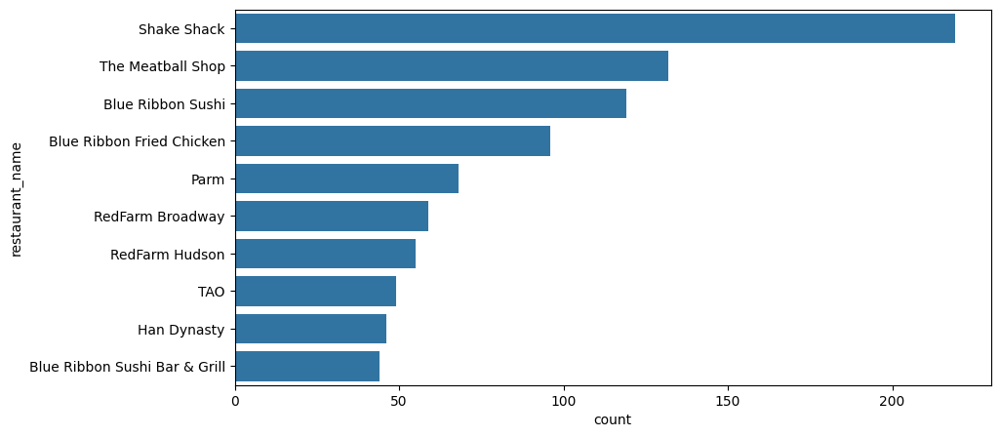

In [115]:
# Countplot to show the top 10 restaurants.
plt.figure(figsize=(10,5))
sns.countplot(data=foodhub_df, y='restaurant_name', order=foodhub_df['restaurant_name'].value_counts().index[:10])
plt.show()


#### Observations
*  Total 178 unique restaurants in this foodhub dataset.
*  The countplot shows that the top 10 restaurant counts.
  * This tells that first 5 restaurant got orders above 100.
  * The major one is "Shake Shack" restaurant.
   



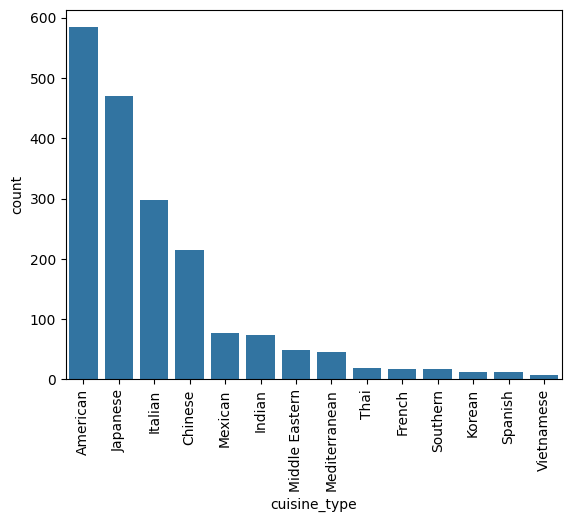

In [ ]:
# Cusine type counts

# Count plot
sns.countplot(data=foodhub_df, x='cuisine_type', order=foodhub_df['cuisine_type'].value_counts().index)
plt.xticks(rotation=90)
plt.show()


In [ ]:
foodhub_df['cuisine_type'].value_counts()

,count
cuisine_type,
American,584
Japanese,470
Italian,298
Chinese,215
Mexican,77
Indian,73
Middle Eastern,49
Mediterranean,46
Thai,19


#### Observations
In the cuisine type barchart.
*  American cuisine is top most orders received.
*  2nd largest orders for Japanese cuisine.
*  Very less ordered received for Vietnamese cusine.


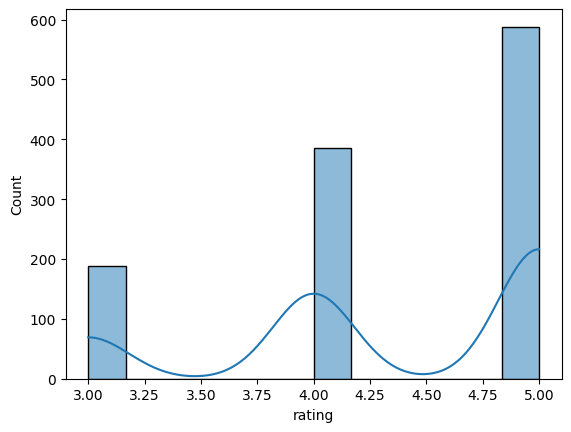

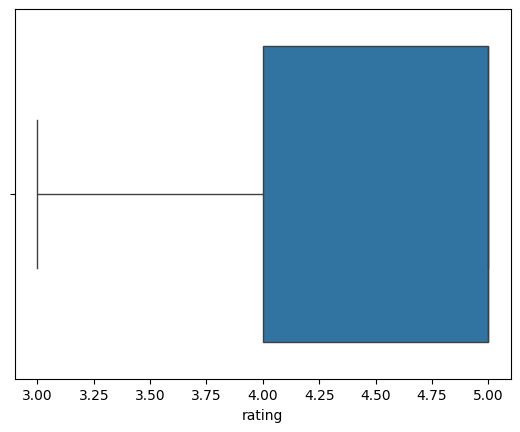

,rating
count,1162.000000
mean,4.344234
std,0.741478
min,3.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


In [ ]:
# Rating distribution

# Histogram plot
sns.histplot(data=foodhub_df, x='rating', kde=True)
plt.show()

# Box plot
sns.boxplot(data=foodhub_df, x='rating')
plt.show()
foodhub_df['rating'].describe().T

#### Observations
Customer rating distrubtions:
* Histogram plot, the distribution is left skewed. In which, less than 25% of customers given below 4 rating.
* Boxplot, the distribution don't have outliers.
* 50% and above of the customers given 5 ratings.
* Between 25 to 50 percent of the customer given 4 to 5 ratings.
* In this foodbut-data set, 75% of the orders received >=4 ratings.

### **Question 7**: Which are the top 5 restaurants in terms of the number of orders received? [1 mark]

In [ ]:
# Restaurant counts
foodhub_df['restaurant_name'].value_counts()

,count
restaurant_name,
Shake Shack,219
The Meatball Shop,132
Blue Ribbon Sushi,119
Blue Ribbon Fried Chicken,96
Parm,68
...,...
Rye House,1
Hiroko's Place,1
Frank Restaurant,1


In [ ]:
# Write the code here
# Get top 5 restaurant counts
foodhub_df['restaurant_name'].value_counts().head(5)

,count
restaurant_name,
Shake Shack,219
The Meatball Shop,132
Blue Ribbon Sushi,119
Blue Ribbon Fried Chicken,96
Parm,68


In [ ]:
# Get the percentage of total orders per restaurant.
foodhub_df.groupby('restaurant_name')['order_id'].count().sort_values(ascending=False)/foodhub_df.shape[0]*100

,order_id
restaurant_name,
Shake Shack,11.538462
The Meatball Shop,6.954689
Blue Ribbon Sushi,6.269758
Blue Ribbon Fried Chicken,5.057956
Parm,3.582719
...,...
The MasalaWala,0.052687
Taro Sushi,0.052687
Woorijip,0.052687


#### Observations:
Top 5 restaurants are "Shake Shack", "The Meatball Shop", "Blue Ribbon Sushi", "Blue Ribbbon Fried Chicken" and "Parm".
* Out of 178 restaurants, "Shake Shack" received 219 orders.
* "Shake Shack" - 12% orders from total orders.


### **Question 8**: Which is the most popular cuisine on weekends? [1 mark]

In [ ]:
# Write the code here
# Get the cuisine type count for only weekend orders.
foodhub_df[foodhub_df['day_of_the_week']=='Weekend']['cuisine_type'].value_counts()

,count
cuisine_type,
American,584
Japanese,470
Italian,298
Chinese,215
Mexican,77
Indian,73
Middle Eastern,49
Mediterranean,46
Thai,19


#### Observations:
On weekends the following cuisine types are the most popular ones:

American,
Japanese,
Italian,
Chinese,
Mexican,
Indian,
Middle Eastern,
Mediterranean,
Thai,
French,
Southern,
Korean,
Spanish,
Vietnamese



### **Question 9**: What percentage of the orders cost more than 20 dollars? [2 marks]

In [124]:
# Write the code here
# Get the percentage of cost of the order is > 20 dollars.
foodhub_df[foodhub_df['cost_of_the_order']>20].shape[0]/foodhub_df.shape[0]*100

29.24130663856691

#### Observations:
29% of orders are more than 20 dollars.

### **Question 10**: What is the mean order delivery time? [1 mark]

In [125]:
# Write the code here
# Get the delivery time average.
foodhub_df['delivery_time'].mean()

np.float64(24.161749209694417)

In [126]:
# describe the delivery time series.
foodhub_df['delivery_time'].describe().T

,delivery_time
count,1898.000000
mean,24.161749
std,4.972637
min,15.000000
25%,20.000000
50%,25.000000
75%,28.000000
max,33.000000


#### Observations:
Average time to take  is 24minutes.


### **Question 11:** The company has decided to give 20% discount vouchers to the top 3 most frequent customers. Find the IDs of these customers and the number of orders they placed. [1 mark]

In [127]:
# Write the code here
# Get the top 3 customer counts.
foodhub_df['customer_id'].value_counts().head(3)

,count
customer_id,
52832,13
47440,10
83287,9


#### Observations:
In foodhub dataset, the below top 3 cusomters are frequently ordered.

|custmer_id | count |
| ---------| ---- |
| 52832 | 13 |
| 47440 | 10 |
| 83287 | 9  |


### Multivariate Analysis

### **Question 12**: Perform a multivariate analysis to explore relationships between the important variables in the dataset. (It is a good idea to explore relations between numerical variables as well as relations between numerical and categorical variables) [10 marks]


In [137]:
# This helper code allows to support the correlation in the upcoming multivariant charts.

########################################
# Purpose: Calculate revenue           #
# param: {string} - cost of the order. #
# return: {int} - calculated revenue.  #
#######################################
def calculate_revenue(cost):
  if cost > 20:
    return cost * 0.25 # 25% for orders > $20
  elif cost > 5:
    return cost * 0.15 # 15% for orders > $5
  else:
    return 0 # No charge for orders <= $5

# Apply the function to calculate commision for each order.
foodhub_df['commision'] = foodhub_df['cost_of_the_order'].apply(calculate_revenue)
foodhub_df['total_time'] = foodhub_df['food_preparation_time'] + foodhub_df['delivery_time']

In [138]:
# Write the code here
# Selecting only numerical columns
numerical_columns = foodhub_df.dtypes[foodhub_df.dtypes != 'object'].index

In [139]:
# Check for corrulation among numerical variables.
corr = foodhub_df.loc[:,numerical_columns.drop('commision')].corr()
corr

,order_id,customer_id,cost_of_the_order,rating,food_preparation_time,delivery_time,total_time
order_id,1.000000,-0.013960,0.021171,-0.022405,-0.007026,0.009690,0.002288
customer_id,-0.013960,1.000000,-0.001322,0.001239,-0.030330,-0.009885,-0.027754
cost_of_the_order,0.021171,-0.001322,1.000000,0.002335,0.041527,-0.029949,0.006358
rating,-0.022405,0.001239,0.002335,1.000000,-0.005422,-0.005722,-0.007839
food_preparation_time,-0.007026,-0.030330,0.041527,-0.005422,1.000000,0.011094,0.685970
delivery_time,0.009690,-0.009885,-0.029949,-0.005722,0.011094,1.000000,0.735195
total_time,0.002288,-0.027754,0.006358,-0.007839,0.685970,0.735195,1.000000


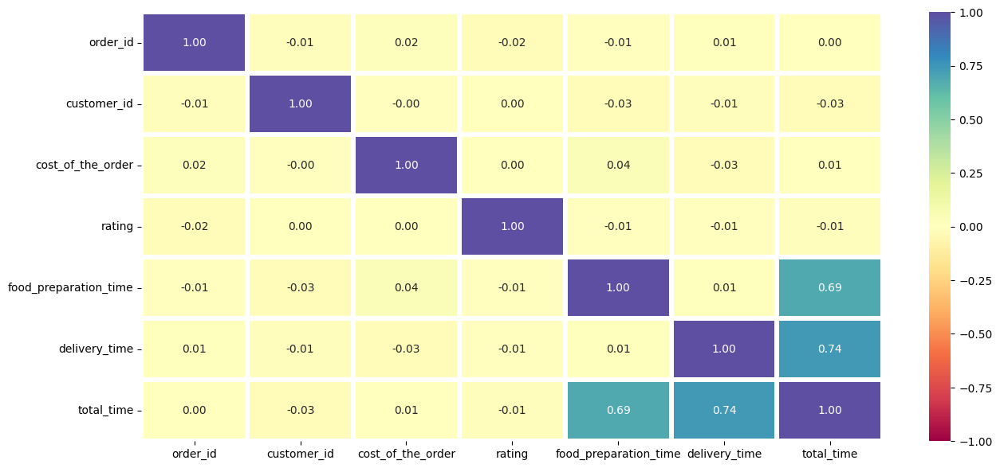

In [141]:
# Heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(corr, annot=True,vmin=-1, vmax=1, fmt='.2f', cmap='Spectral', linewidths=4)
plt.show()

#### Observations

The heatmap shows the correlation coefficients between all key numerical variables in the dataset. The correlation range set from -1 to 1.

* Total Time and Delivery time shows the high correlation(0.74). Also Total time and  food preparation time show the 2nd high correlation(0.69). Since both food_preparation time and delivery time significantlly contribute total time. If delivery time increase eventually total time will increase. As well as food_preparation_time increases then total time will get increase.
* cost of the order and rating is no correlation(0.00). This indicates that expensive orders may receive high or low ratings. Hence comapny shouldn't expect the good ratings for expensive orders.
* food_preparation_time and delivery_time is very week correlation(-0.01). Hence there is no direct connect between these 2 variables. They are independent each other. Delivery might handled by 3rd party vendors like ubereats, doordash etc.,
* The cost of order shows very week correlation with all the time variables (food_prepration_time, delivery_time and total_time). These are negligible correlation.
* The customer rating has no significant correlation with any of the time variables (food_prepration_time, delivery_time and total_time). This correlation also negligible.






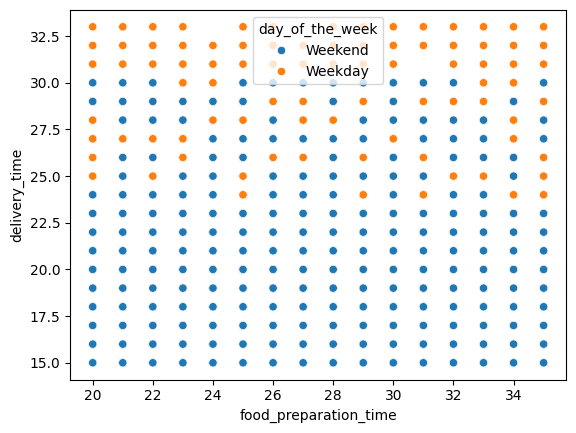

In [142]:
# Scatterplot
sns.scatterplot(data=foodhub_df, x='food_preparation_time', y='delivery_time', hue='day_of_the_week')
plt.show()

In [146]:
import plotly.io as pio
pio.renderers.default = 'notebook'

import plotly.express as px
px.scatter_3d(foodhub_df, x='food_preparation_time', y='delivery_time', z='total_time', color='day_of_the_week')


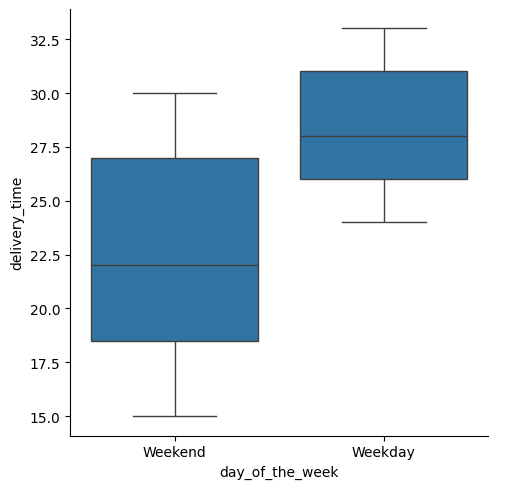

In [144]:
# CatPlot
sns.catplot(data=foodhub_df, x='day_of_the_week', y='delivery_time', kind='box')
plt.show()

#### Observation
* There is no clear linear correlation between food preparation time and delivery time. It indicates the delivery team is independent contractors.
* Delivery time is shorter in weekend compare to weekdays. Also from the catplot, average shows weekend is less than weekday. From this analysis, there is less traffic during weekend.

In [ ]:
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time,commision,total_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,5.0,25,20,7.6875,45
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,5.0,25,23,1.8120,48
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5.0,23,28,1.8345,51
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3.0,25,15,7.3000,40
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4.0,25,24,1.7385,49


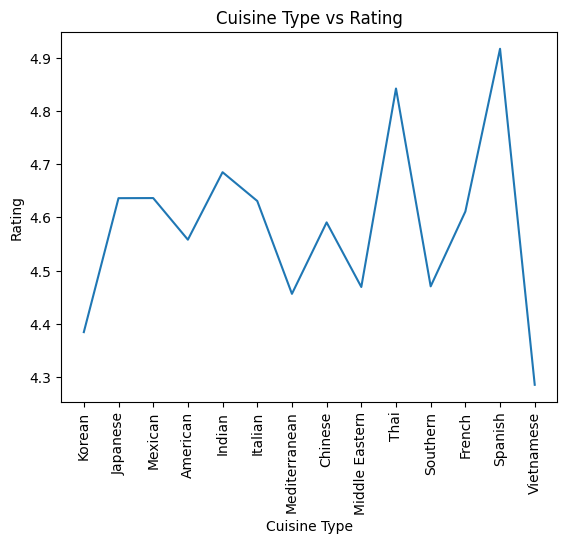

In [ ]:
# Lineplot (Cuisine Type vs Rating)
sns.lineplot(data=foodhub_df, x='cuisine_type', y='rating', errorbar=None)
plt.xticks(rotation=90)
plt.xlabel('Cuisine Type')
plt.ylabel('Rating')
plt.title('Cuisine Type vs Rating')
plt.show()

#### Observations:

From this lineplot "cuisine_type" vs "rating", we observed that,

* Overall the customers are given highest/top rating for "Spanish" cuisine type.
* Second highest rating is for "Thai" cuisine type.
* Korean, Mediterranean, Middle Eastern, Southern cuisne types are below 4.5 ratings.

In [ ]:
# List the cuisine type from highest to lowest average cost_of_the_order.
foodhub_df.groupby('cuisine_type')['cost_of_the_order'].mean().sort_values(ascending=False)

,cost_of_the_order
cuisine_type,
French,19.793889
Southern,19.300588
Thai,19.207895
Spanish,18.994167
Middle Eastern,18.820612
Mexican,16.933117
Indian,16.919726
Italian,16.418691
American,16.319829


In [ ]:
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time,commision,total_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,5.0,25,20,7.6875,45
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,5.0,25,23,1.8120,48
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5.0,23,28,1.8345,51
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3.0,25,15,7.3000,40
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4.0,25,24,1.7385,49


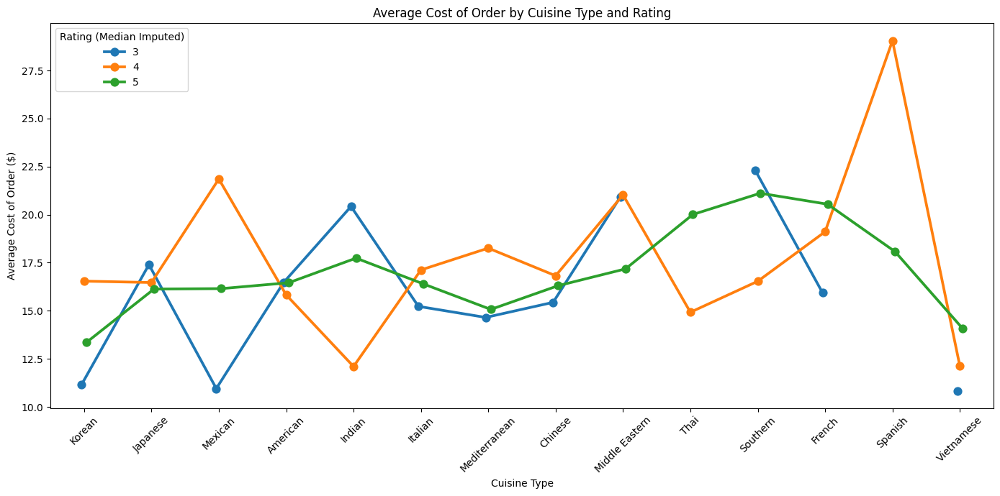

In [ ]:
# Lineplot (Average Cost of orders vs Cuisine Type)
foodhub_df['rating_round'] = foodhub_df['rating'].round().astype(int)

plt.figure(figsize=(14, 7))
sns.pointplot(data=foodhub_df, x='cuisine_type', y='cost_of_the_order', hue='rating_round', palette='tab10', errorbar=None, dodge=True, estimator=np.mean)
plt.title('Average Cost of Order by Cuisine Type and Rating')
plt.xlabel('Cuisine Type')
plt.ylabel('Average Cost of Order ($)')
plt.xticks(rotation=45)
plt.legend(title='Rating (Median Imputed)')
plt.tight_layout()
plt.show()


#### Observations:
Across most cuisines, the trend is either upward or flat, which indicates that higher demand corresponds to higher average spending per order

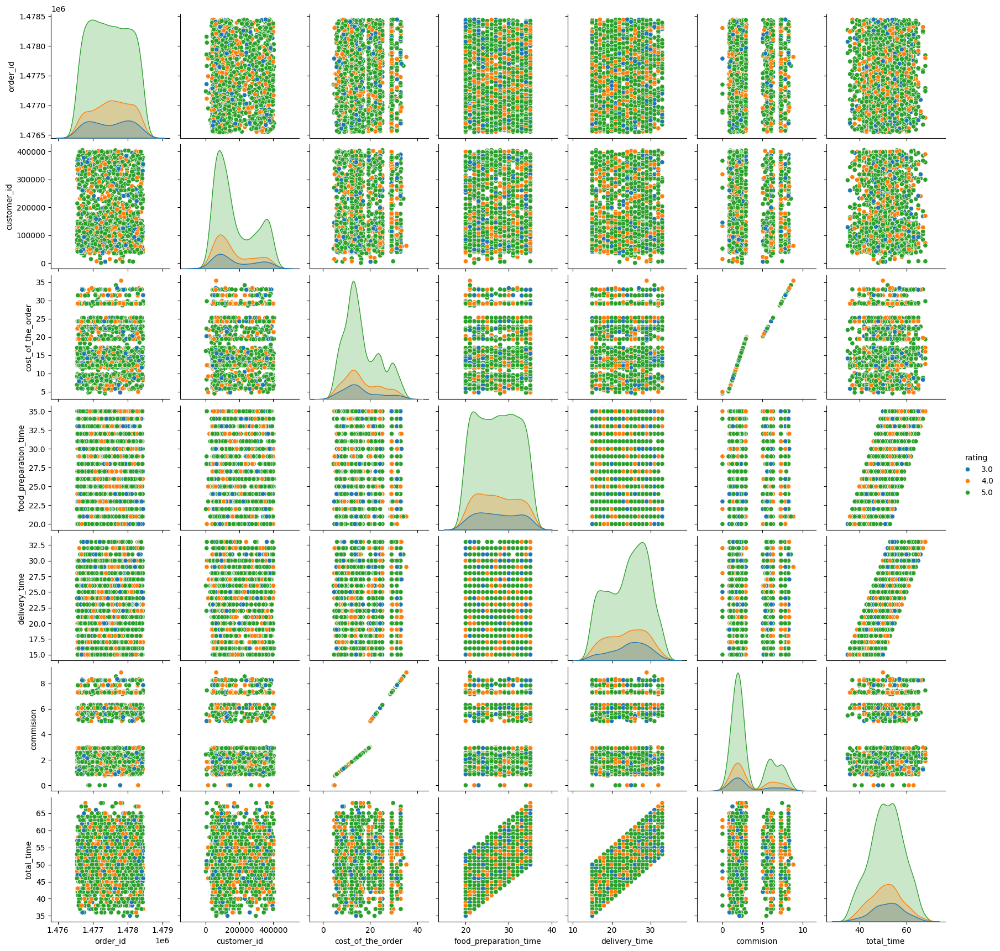

In [ ]:
# Pairplot
num_var = foodhub_df.dtypes[foodhub_df.dtypes != 'object'].index

sns.pairplot(data=foodhub_df[num_var], hue='rating', palette='tab10')
plt.show()

#### Observation
#####Univariate Analysis: (Diagonal plots):

Cost of order: This plot distribution is right-skeweked. So customers ordered mostly in the lower cost brakets. The tail section is hight cost order which is lean.

Food Prepration time and delivery time both shows the distribution is narrow. They are centered around typical business operation times (20-35mins for each). The operation are manageed with this specific time window.

Rating distribution shows 3 distincts peaks at 3,4 and 5. The largets peak is 4. This is median, which is included the imputed "Not given" values.

Total Time distrubtion is wider and its look like normal. But its slightly influenced by discrete distributions of preparation and delivery times.

#####Bivariate Analysis: (Off-Diagnoal Plots):

###### High Correlation:

**Total Time vs. Delivery Time & Total Time vs. Food Preparation Time:**
These pairs show a strong linear pattern. This is the highest correlation in the dataset, confirming that both preparation and delivery times are the dominant drivers of the Total Time required for an order.

##### Near-Zero Correlation:
1) Food preparation time vs Deliver time:

The scatter plot for this pair forms a random uniform of points spreaded. This visually confirms the near-zero correlation. It says, the kitchen takes to prepare food has no linear dependence on the time the courier takes to deliver it. These two processes/dept are independent.

2) Cost of the Order vs Time variables:

Comparing the cost against Preparation time, Delivery time or Total Time, the plot shows a scattered, unstructured pattern. It shows near-zero correlation. This indicates that cost of the order isn't lineraly correlated with speed of the services.

3) Rating vs All other variables (Cost, Time):
Rating are scattered in the plots for cost of order and food preparation time, delivery time or total time. There is no strong linear relationship.
This visually tell us, even if the total time is high (~60minutes) but the rating is 5. This means the customer are satisfied with the food even its long wait time.
Also noted that total time is low (eg: 40minutes) but the rating is 3. This tells that the low rating was likely driven by factors other than speed, such as incorrect order, cold food, bad presentation, less tasty food or poor customer service.


### **Question 13:** The company wants to provide a promotional offer in the advertisement of the restaurants. The condition to get the offer is that the restaurants must have a rating count of more than 50 and the average rating should be greater than 4. Find the restaurants fulfilling the criteria to get the promotional offer. [3 marks]

In [ ]:
# Write the code here
# List the restaurants to met the criteria to get the promotional offer.
restaurant_stats = foodhub_df.groupby('restaurant_name')['rating'].agg(['count', 'mean'])
restaurant_stats = restaurant_stats[(restaurant_stats['count'] > 50) & (restaurant_stats['mean'] > 4)]
print(f'Total {restaurant_stats.count(axis=0).iloc[0]} restaurants mets the criteria to get the promotional offer.')
print(restaurant_stats.sort_values(by='count', ascending=False));





Total 7 restaurants mets the criteria to get the promotional offer.
                           count      mean
restaurant_name                           
Shake Shack                  219  4.561644
The Meatball Shop            132  4.689394
Blue Ribbon Sushi            119  4.521008
Blue Ribbon Fried Chicken     96  4.552083
Parm                          68  4.500000
RedFarm Broadway              59  4.474576
RedFarm Hudson                55  4.490909


#### Observations:
* There are 7 restaurants mets the criteria to get the prootional offer.

### **Question 14:** The company charges the restaurant 25% on the orders having cost greater than 20 dollars and 15% on the orders having cost greater than 5 dollars. Find the net revenue generated by the company across all orders. [3 marks]

In [130]:
# Write the code here

########################################
# Purpose: Calculate revenue           #
# param: {string} - cost of the order. #
# return: {int} - calculated revenue.  #
#######################################
def calculate_revenue(cost):
  if cost > 20:
    return cost * 0.25 # 25% for orders > $20
  elif cost > 5:
    return cost * 0.15 # 15% for orders > $5
  else:
    return 0 # No charge for orders <= $5

# Apply the function to calculate commision for each order.
foodhub_df['commision'] = foodhub_df['cost_of_the_order'].apply(calculate_revenue)

# Sum the commision to get the total net revenue.
total_revenue = foodhub_df['commision'].sum()

print(f'The total net revenue generated by the company across all orders is ${total_revenue:.2f}.')


The total net revenue generated by the company across all orders is $6166.30.


#### Observations:
Total net revenue generated by the company across all order is $6166.30.

### **Question 15:** The company wants to analyze the total time required to deliver the food. What percentage of orders take more than 60 minutes to get delivered from the time the order is placed? (The food has to be prepared and then delivered.) [2 marks]

In [131]:
# Write the code here

# Get total time
foodhub_df['total_time'] = foodhub_df['food_preparation_time'] + foodhub_df['delivery_time']

# Calculate percentage order
percentage_orders = foodhub_df[foodhub_df['total_time']>60].shape[0]/foodhub_df.shape[0]*100

print(f'{percentage_orders:.2f}% of orders take more than 60 minutes to get delivered from the time the order is placed.')


10.54% of orders take more than 60 minutes to get delivered from the time the order is placed.


#### Observations:
From the analysis of this foodhub dataset, 10.54% of orders take more than 60 minutes to get delivered from the time the order is placed.

### **Question 16:** The company wants to analyze the delivery time of the orders on weekdays and weekends. How does the mean delivery time vary during weekdays and weekends? [2 marks]

In [132]:
# Write the code here
# Get the day of the week by average delivery_time.
foodhub_df.groupby('day_of_the_week')['delivery_time'].mean()

,delivery_time
day_of_the_week,
Weekday,28.340037
Weekend,22.470022


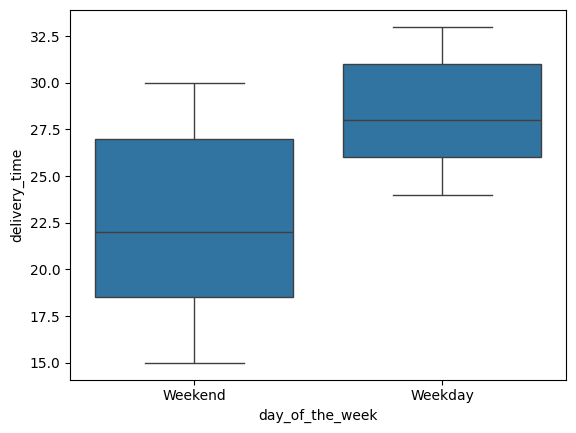

In [ ]:
# Box Plot
sns.boxplot(data=foodhub_df, x='day_of_the_week', y='delivery_time')
plt.show()

#### Observations:

The mean delivery time for weekdays is approximately 28.34 minutes and weekend is approximately 22.47 minutes.

It indicates that, on an average during weekend the delivery time is shorter than weekdays. This could be due to less traffic on weekends leads to faster travel


### Conclusion and Recommendations

### **Question 17:** What are your conclusions from the analysis? What recommendations would you like to share to help improve the business? (You can use cuisine type and feedback ratings to drive your business recommendations.) [6 marks]

### Conclusions:

We analyzed customer orders from the FoodHub platform, focusing on the relationship between cost, preparation/delivery time, day of the week, cuisine type, and customer ratings.

We have been able to conclude that:

1. The absolute correlation between Total Time and Rating is negligible, the average total time for $3$-star orders is significantly longer than for $5$-star orders. This suggests that efficient service is a critical factor for risk mitigation, making a customer less likely to give a poor rating.

2. Food preparation time and delivery time have a near-zero correlation (~ approx 0.01). This confirms that the kitchen operation and the courier logistics are distinct processes(independent), and delays in one do not cause delays in the other.

3. Contrary to common service industry patterns, the mean delivery time is significantly slower on weekdays (~ approx 28$ minutes) compared to weekends (~ approx 22 minutes). This points to an issue with weekday routing or courier availability.

4. The cost of the order is not correlated with the customer rating or the time taken for service. Customers are willing to pay a premium, but price alone does not guarantee satisfaction or speed.

5. In specific cuisine types, notably Vietnamese, ~3-star rated orders are found to be more expensive on average than $5$-star orders. This highlights a critical failure in perceived value, where paying more leads to a worse experience.

6. French, mean cost of order is high than other cuisine types. Its ratings are 3, 4, 5. However this cuisine type only 18 orders, only 2 customers given 3 rating. Consider these facts, french cuisine type is higher quality and customers are liked it.  

7. Four restaurants—Shake Shack, The Meatball Shop, Blue Ribbon Fried Chicken, and Blue Ribbon Sushi—are the most reliable, consistently achieving high volume (rating count $>50$) and high satisfaction (average rating ~>4).

### Recommendations:

1. WeekDay Logistics:Since weekday delivery is 6 minutes slower on average, investigate and implement solutions to optimize weekday routing and traffic management. The delivery service agents/couriers can lookout lunchtime zones to reduce the time and get closer to weekend mean.

2. Risk Mitigation: 10.5% of the orders exceeding 60 minutes of total time (food preparation + delivery time) is the critical data for operational improvement. Eliminating these high-risk orders will significantly reduce the overall number of 3-star ratings.

3. High Cost/Low-Rating: Investigate the specific restaurants or dish types within Vietnamese cuisine where customers pay more but it got lowwer ratings. Address these restaurant partners for order accuracy, food quality, staffs and chef - team dynamics and packaging issues.

4. High Quality/Average-Rating: Promote French cusine types specific restaurants to get more orders. Since customer liking this cuisine type thought the cost of the order is high. Introduce this cusine types top 5 restaurants (Shake Shack, The Meatball Shop, Blue Ribbon Fried Chicken, and Blue Ribbon Sushi)

5. Promotional Focus: Base all large-scale loyalty programs and advertisements around the four qualifying restaurants (Shake Shack, The Meatball Shop,Blue Ribbon Sushi, Blue Ribbon Fried Chicken).
Leverage their high volume and high ratings to drive trust and acquisition.

6. Feedback: Since the overall rating is vague, update the app to prompt customers to rate order accuracy, food quality/temperature, delivery experience. This will provide actionable data that isolates the root cause of a poor rating.



---